# Calibración de cámaras
## Fundamentos de Análisis de Imágenes

- Nombre 1: 
- Nombre 2: 
- Nombre 3: 

## Objetivos


Los objetivos de esta práctica son:
* Calibrar una cámara usando el método de calibración de Zhang, que está implementado en OpenCV.
* Hacer uso de los resultados de la calibración en un sistema simple de realidad aumentada que proyecte un modelo 3D sintético sobre imágenes reales.

En esta práctica se usarán las imágenes contenidas en la carpeta ``left`` para calibrar la cámara y un modelo tridimensional en ``models/bunny.py`` que se proyectará sobre las imágenes una vez calibrada la cámara. La carga del modelo en Python se realiza como si fuera un módulo. Por ejemplo: ``from models import bunny``.
El módulo cargado contiene dos variables:
  - ``bunny.vertices`` es una matriz $4 × N_v$ con las coordenadas homogéneas de los $N_v$ vértices del modelo (en este caso, el conejo de Stanford). Cada columna son las coordenadas de un vértice.
  - ``bunny.edges`` es una matriz 2×N e con los N e arcos del modelo. Cada columna contiene los índices de los dos vértices que une un arco.

OpenCV también dispone de un tutorial sobre calibración de cámaras: https://docs.opencv.org/4.x/dc/dbb/tutorial_py_calibration.html

## 1. Calibración de una cámara

En esta parte se trabajará con la secuencia de imágenes del directorio ``left``. Esta secuencia contiene una serie de imágenes de la plantilla de calibración. Para la calibración se debe tener en cuenta que el tamaño de cada escaque de la plantilla es de 30 mm en las direcciones X e Y.

In [1]:
import copy
import glob

import cv2
import matplotlib.pyplot as plt
import numpy as np

Como es necesario leer una lista de imágenes, usaremos la siguiente función para almacenar todas las imágenes de la carpeta ``left``:

In [2]:
def load_images(filenames):
    """Load multiple images."""
    return [cv2.imread(f) for f in filenames]

Con ``load_images`` podemos cargar todas las imágenes del directorio ``left`` por orden alfabético (la función ``glob.glob`` permite generar la lista de nombres de archivo, y la función ``sorted()`` de Python ordena alfabéticamente una lista de cadenas de texto).

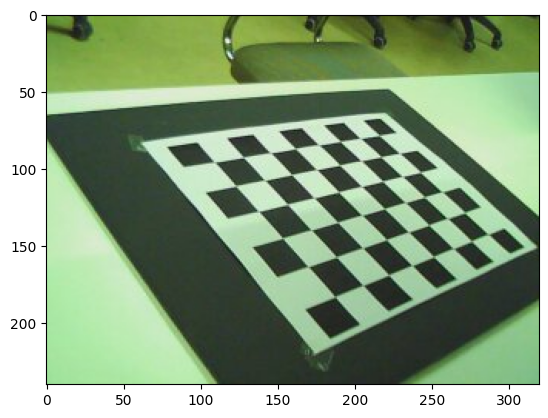

In [3]:
imgs = load_images(sorted(glob.glob('left/*.*')))
plt.imshow(cv2.cvtColor(imgs[0], cv2.COLOR_BGR2RGB))

**Ejercicio 1**: convierte todas las imágenes leídas a escala de grises y guárdalas en una nueva lista llamada ``imgsbw``. Visualiza la primera imagen con ```plt.imshow```.

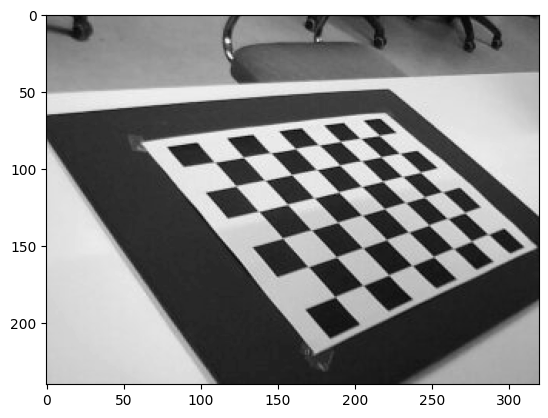

In [4]:
imgsbw = ...

La función [``cv2.findChessboardCorners``](https://docs.opencv.org/4.x/d9/d0c/group__calib3d.html#ga93efa9b0aa890de240ca32b11253dd4a) de
OpenCV busca la plantilla de calibración en una imagen y
devuelve una tupla de dos elementos. El primer elemento
es ``False`` si no consiguió detectar correctamente la plantilla, y
es ``True`` en caso contrario. El segundo elemento contiene las
coordenadas de las esquinas de la plantilla de calibración,
que sólo son válidas si la detección fue exitosa, es decir, si
el primer elemento de la tupla es ``True``.

En esta práctica todas las imágenes contienen la vista completa de la rejilla, por lo que podemos ignorar el primer elemento de la tupla y considerar que siempre es ``True``. Además,  el tamaño de la plantilla de calibración en las imágenes es de (8, 6) (columnas x filas)

In [5]:
corners = [cv2.findChessboardCorners(i, (8,6)) for i in imgs]

In [ ]:
corners[0] -> (retVal, corners)

El siguiente ejercicio consiste en dibujar sobre las imágenes los puntos detectados por ``cv.FindChessboardCorners``. Por motivos de eficiencia, la función empleada para hacerlo modifica directamente la imagen pasada por parámetro en lugar de hacer una copia. Para evitar perder las imágenes originales es mejor realizar una copia de las mismas con antelación. Una forma de hacerlo es ``imgs2 = copy.deepcopy(imgs)``
donde ``imgs`` es la lista de imágenes cargadas. Utiliza estas imágenes copiadas en lugar de las
originales en el siguiente ejercicio.

**Ejercicio 2.** Usa [``cv2.drawChessboardCorners``](https://docs.opencv.org/4.x/d9/d0c/group__calib3d.html#ga6a10b0bb120c4907e5eabbcd22319022) para dibujar las esquinas detectadas en el ejercicio anterior. Aplícalo a todas las imágenes que fueron correctamente detectadas. Ignora el resto.
Muestra alguna de las imágenes resultantes.

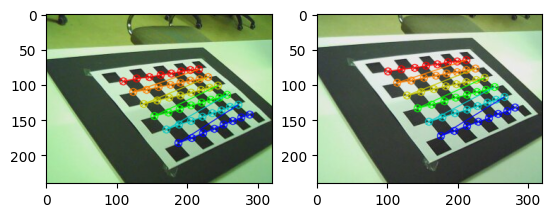

Para calibrar la cámara, además de las coordenadas de
las esquinas en cada una de las imágenes, se necesitan las
coordenadas tridimensionales de las esquinas en el sistema
de referencia de la escena. Para esta práctica consideraremos que el centro del sistema de referencia, esto es, el
punto de coordenadas $[0, 0, 0]^\top$, es la primera esquina de
la plantilla de calibración detectada en todas las imágenes.
También consideraremos que el eje X corresponde al lado
corto de la plantilla de calibración, y el eje Y al lado largo.
Esta disposición implica que el eje Z apunta en la dirección
normal hacia arriba del plano de calibración.

La función ``get_chessboard_points(chessboard_shape, dx, dy)`` genera una matriz NumPy de
tamaño $N × 3$ con las coordenadas $(x,y,z)$, resp. (*columna, fila, 0*),  de las esquinas de
la plantilla de calibración en el sistema de referencia de la
escena. $N$ es el número de esquinas de la plantilla.

``chessboard_shape`` es el número de puntos (*columnas, filas*) de la plantilla de calibración, que debe ser (8, 6). ``dx`` (resp. ``dy``) es el ancho
(resp. alto) de un escaque de la plantilla de calibración.
Para la plantilla utilizada en esta práctica, ambos valores
son 30mm.

In [7]:
def get_chessboard_points(chessboard_shape, dx, dy):
    """El orden de las coordenadas es (fila, columna, )"""
    return np.array([(x*dx, y*dy, 0) for x in range(chessboard_shape[1])
                                     for y in range(chessboard_shape[0])])

cb_points = get_chessboard_points((8,6), 30, 30)
cb_points

array([[  0,   0,   0],
       [  0,  30,   0],
       [  0,  60,   0],
       [  0,  90,   0],
       [  0, 120,   0],
       [  0, 150,   0],
       [  0, 180,   0],
       [  0, 210,   0],
       [ 30,   0,   0],
       [ 30,  30,   0],
       [ 30,  60,   0],
       [ 30,  90,   0],
       [ 30, 120,   0],
       [ 30, 150,   0],
       [ 30, 180,   0],
       [ 30, 210,   0],
       [ 60,   0,   0],
       [ 60,  30,   0],
       [ 60,  60,   0],
       [ 60,  90,   0],
       [ 60, 120,   0],
       [ 60, 150,   0],
       [ 60, 180,   0],
       [ 60, 210,   0],
       [ 90,   0,   0],
       [ 90,  30,   0],
       [ 90,  60,   0],
       [ 90,  90,   0],
       [ 90, 120,   0],
       [ 90, 150,   0],
       [ 90, 180,   0],
       [ 90, 210,   0],
       [120,   0,   0],
       [120,  30,   0],
       [120,  60,   0],
       [120,  90,   0],
       [120, 120,   0],
       [120, 150,   0],
       [120, 180,   0],
       [120, 210,   0],
       [150,   0,   0],
       [150,  30

Para calibrar la cámara se usará la lista de resultados de ``cv2.findChessboardCorners``
y el conjunto de puntos del modelo dados por ``get_chessboard_points`` del apartado anterior.

La función [```cv2.calibrateCamera```](https://docs.opencv.org/4.x/d9/d0c/group__calib3d.html#ga3207604e4b1a1758aa66acb6ed5aa65d) nos permite estimar todos los parámetros que necesitamos para calibrar la cámara, y se dividen en dos grupos:
- Parámetros internos: matriz de intrínsecos de la cámara y coeficientes de distorsión de la lente.
- Parámetros externos: rotación y traslación de la cámara en el sistema de referencia.

Para ello, simplemente hay que preparar los puntos 3D de la rejilla en ```cb_points``` y los puntos detectados en las imágenes en ```corners``` para asegurarnos de que tengan el formato correcto.

In [8]:
# object_points: dimensiones (numero_de_imagenes, numero_de_puntos, 3)
object_points = np.array([cb_points] * len(imgs), dtype=np.float32)

# image_points: dimensiones (numero_de_imagenes, numero_de_puntos, 2)
image_points = np.array([corner for retVal, corner in corners])[:,:,0,:]

**Ejercico 3**: llama a la función ```cv2.calibrateCamera``` con los parámetros necesarios: puntos 3D en ```object_points```, puntos 2D en ```image_points``` y tamaño de las imágenes en una tupla.

In [9]:
# Sustituir cada conjunto de puntos suspensivos por el parámetro correspondiente
rms, intrinsics, dist_coeffs, rvecs, tvecs = cv2.calibrateCamera(..., ..., ..., None, None, flags=cv2.CALIB_FIX_ASPECT_RATIO)

print("Matriz de intrinsecos:\n",intrinsics)
print("Coefifcientes de distorsion:", dist_coeffs)
print("rms:", rms)

Matriz de intrinsecos:
 [[419.95327794   0.         148.56986692]
 [  0.         419.95327794 126.91976277]
 [  0.           0.           1.        ]]
Coefifcientes de distorsion: [[ 2.04419142e-02 -3.36079102e+00  5.12435002e-03 -6.64287508e-03
   2.01594495e+01]]
rms: 0.1540602153731273


## 2. Realidad aumentada

El término *realidad aumentada* hace referencia al conjunto de técnicas que permiten representar información sintética no existente en el mundo real sobre imágenes reales. En nuestro caso, la información
sintética son modelos tridimensionales. Los siguientes ejercicios proponen una serie de pasos para implementar un
pequeño sistema de realidad aumentada, para lo cual serán necesarios los parámetros obtenidos durante la calibración.

**Ejercicio 4**: implementa la función``m = proj(K, T, verts)`` que, dada la matriz de intrínsecos K (dimensión 3 x 3), extrínsecos T (dimensión 3 x 4) y una matriz de vértices expresados en coordenadas homogéneas ``verts``, calcule la proyección de los vértices 3D a puntos 2D de la imagen. Las coordenadas 2D resultantes deben ser homogéneas.

In [10]:
def proj(K, T, verts):
    return  ...

**Ejercicio 5**: implementa una función ``plothom(points)`` que dibuje un conjunto de puntos 2D de entrada expresados en coordenadas homogéneas. Para ello, primero hay que convertir las coordenadas homogéneas a coordenadas del plano dividiendo cada punto por el valor de la dimensión extra. Para pintar los puntos se puede usar la función [```plt.plot```](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.plot.html) de la siguiente forma: ```plt.plot(xx, yy, '.')``` donde ```xx``` e ```yy``` son las listas con las coordenadas x e y de todos los puntos.

In [11]:
def plothom(points):
    ...

In [ ]:
(x, y, z)
(x_z, y_z)

Las funciones implementadas en los ejercicios anteriores permiten proyectar un modelo sobre las imágenes de la secuencia

1. Los vértices del modelo se proyectan con ``proj`` usando los intrínsecos y los extrínsecos de la imagen que corresponda.
2. Los vértices proyectados se dibujan en la imagen con ``plothom``.

In [12]:
def play_ar(intrinsics, rvecs, tvecs, imgs, vertices):    
    for rvec, tvec, img in zip(rvecs, tvecs, imgs):
        # Matriz de extrínsecos T
        rmat, _ = cv2.Rodrigues(rvec)
        T = np.hstack((rmat, tvec))
        # Projectar los puntos
        v2d = proj(intrinsics, T, vertices)
        # Dibujar los puntos proyectados
        plothom(v2d)
        
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.show()

In [13]:
# read bunny model
from models import bunny
bunny.vertices.shape

(4, 3963)

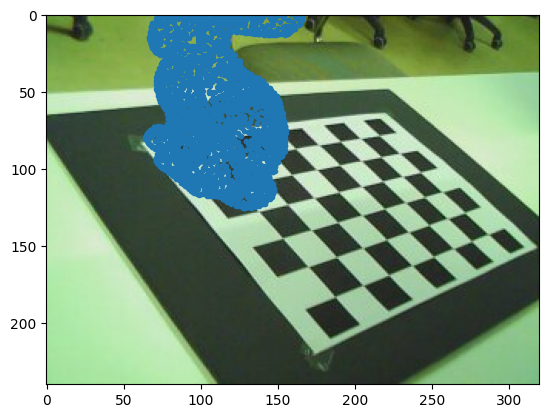

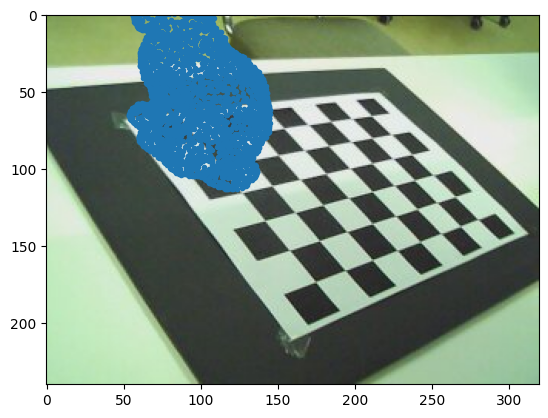

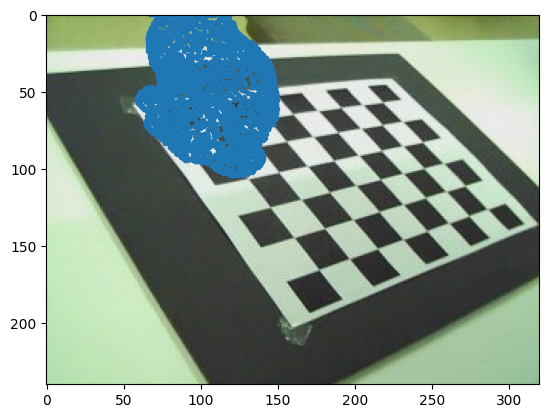

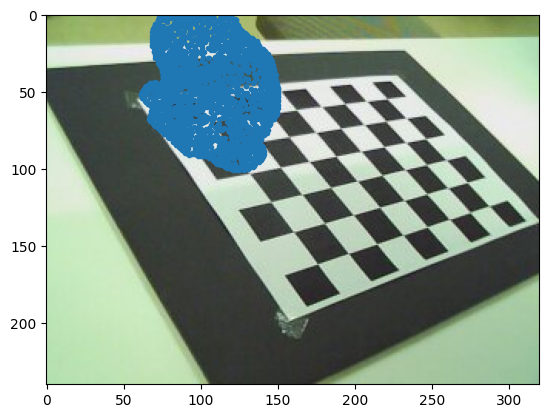

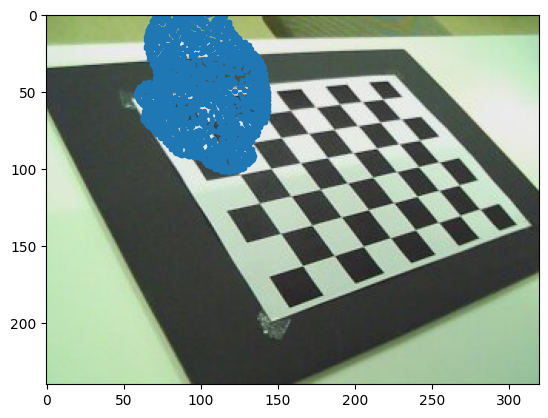

...

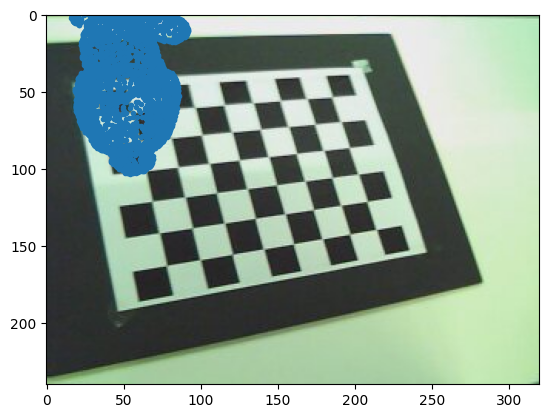

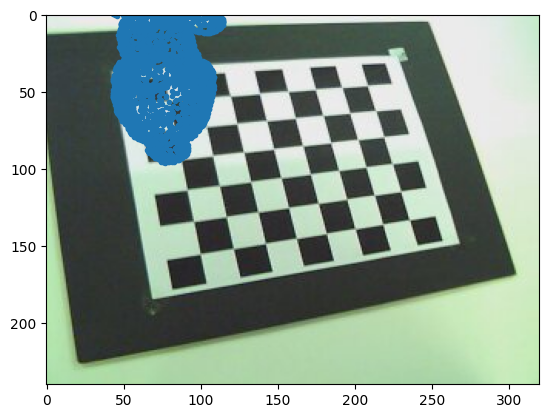

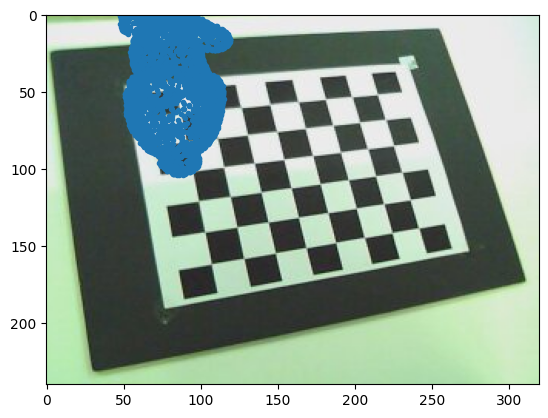

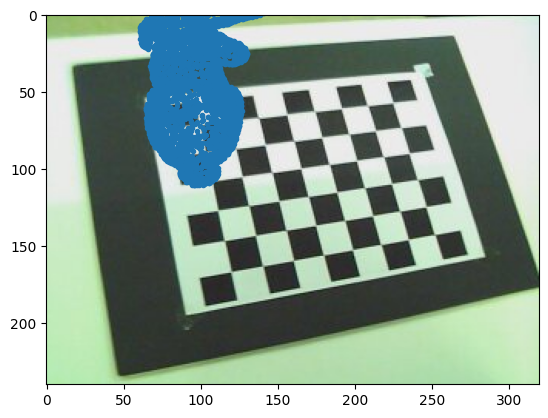

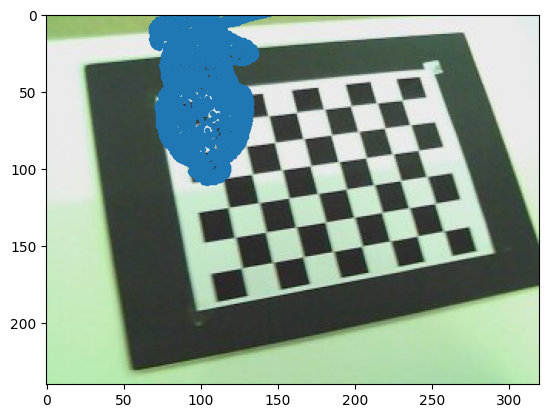

In [14]:
play_ar(intrinsics, rvecs, tvecs, imgs, bunny.vertices)

**Ejercicio 6**: transforma el modelo anterior para que se represente en
el centro de la plantilla de calibración. 
Ejecuta la función ``play_ar``con el nuevo modelo.

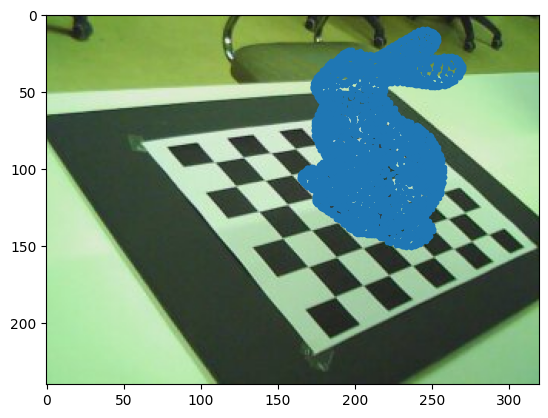

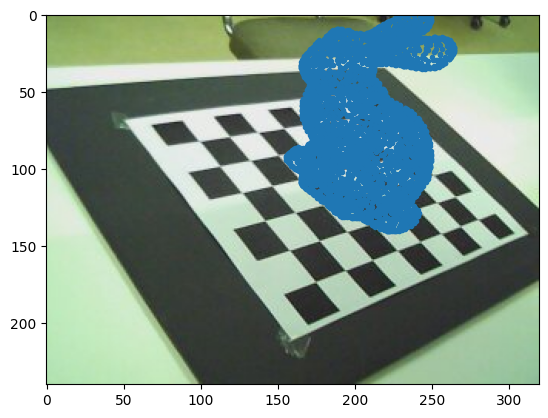

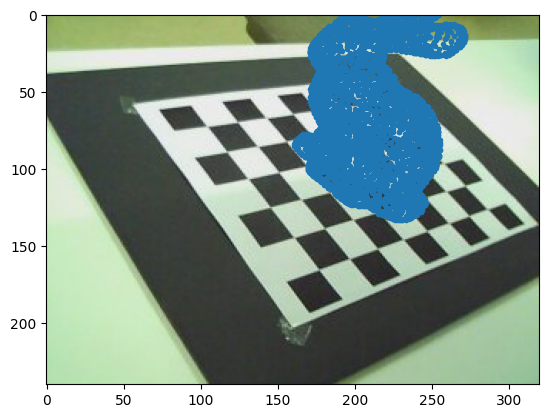

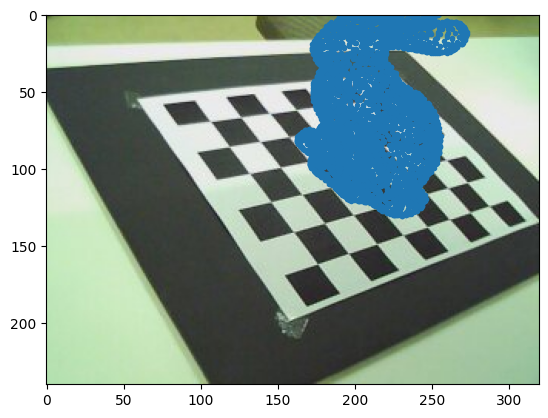

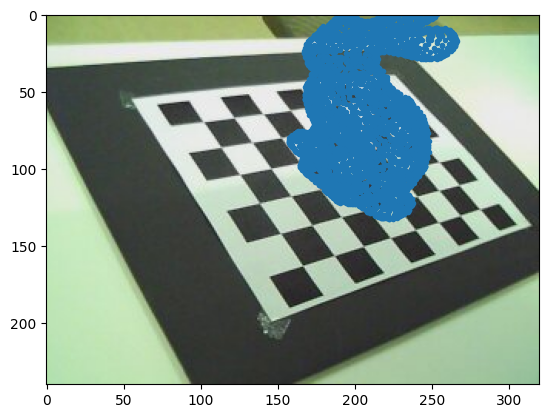

...

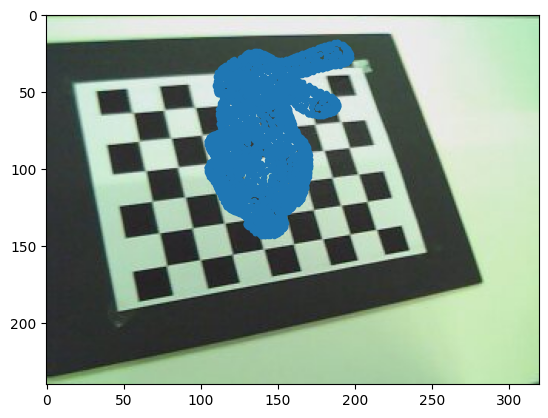

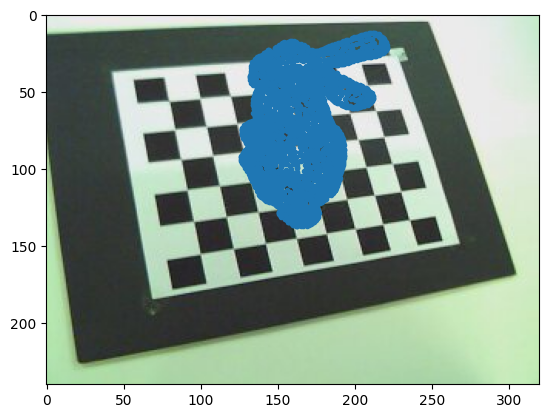

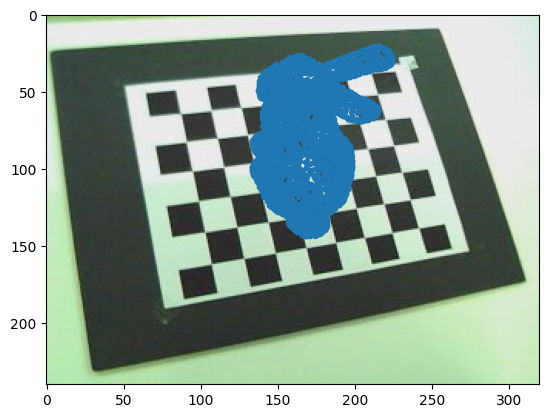

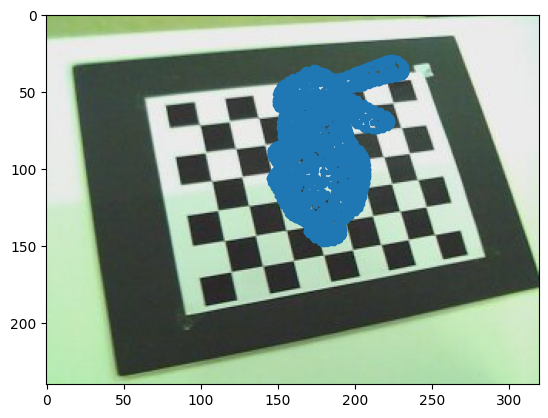

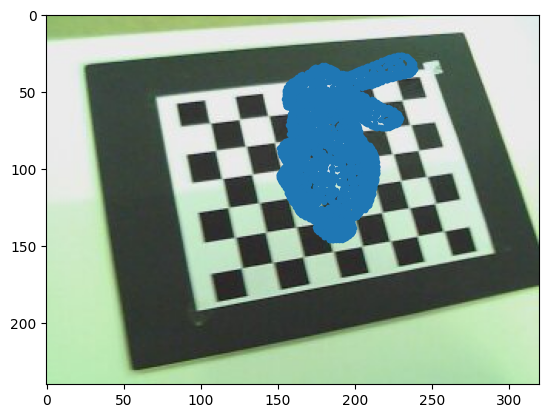

In [15]:
x = x + dx/2
y = y + dy/2